# MSiA 432 - Deep Learning - Final Project
## Group: Alejandra Lelo de Larrea Ibarra, Bannasorn Paspanthong, Ruben Nakano, Samuel Swain
# Style Transfering: Team Members
Reference: https://anderfernandez.com/en/blog/how-to-code-neural-style-transfer-in-python/

In [ ]:
# Import libraries 
from datetime import datetime
import tensorflow as tf
import numpy as np
from PIL import Image as im 

import keras
from keras import Model
from keras.utils import get_file, plot_model
from keras.optimizers import SGD
from tensorflow.keras.applications import vgg19, vgg16

import matplotlib.pyplot as plt 
import matplotlib.image as mpimg

from pathlib import Path
import style_transfering as st

In [2]:
# Try to activate GPUs 
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')
print (f'Found GPU at {device_name}')

Found GPU at /device:GPU:0
Metal device set to: Apple M1 Pro


In [3]:
# --- Common Parameters for all experiments ---

# Define layers to extract for the style and content 
style_layers = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1",]
content_layers = ["block5_conv2"]

# Select pre-trained model
mod_name = "vgg19"
model = vgg19.VGG19(weights="imagenet", include_top=False)

# Dictionary of layers in the model: map layer names to outputs
outputs_dict= dict([(layer.name, layer.output) for layer in model.layers])

# New model: same model inputs, outputs as specified in outputs_dict
feature_extractor = Model(inputs = model.inputs, outputs = outputs_dict)

# Set optimization parameters
learning_rate = 100.0
decay_steps = 100
decay_rate = 0.96
n_iter = 5000

2023-05-14 16:12:54.919802: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Iteration 100: loss=8586.96
Iteration 200: loss=5525.36
Iteration 300: loss=4161.70
Iteration 400: loss=3606.30
Iteration 500: loss=2965.61
Iteration 600: loss=2629.31
Iteration 700: loss=2384.42
Iteration 800: loss=2190.58
Iteration 900: loss=2031.62
Iteration 1000: loss=1905.43
Iteration 1100: loss=1801.61
Iteration 1200: loss=1714.38
Iteration 1300: loss=1640.06
Iteration 1400: loss=1575.81
Iteration 1500: loss=1520.40
Iteration 1600: loss=1471.62
Iteration 1700: loss=1428.62
Iteration 1800: loss=1390.33
Iteration 1900: loss=1356.05
Iteration 2000: loss=1325.33
Iteration 2100: loss=1297.57
Iteration 2200: loss=1272.25
Iteration 2300: loss=1249.22
Iteration 2400: loss=1228.04
Iteration 2500: loss=1208.62
Iteration 2600: loss=1190.67
Iteration 2700: loss=1174.10
Iteration 2800: loss=1158.79
Iteration 2900: loss=1144.56
Iteration 3000: loss=1131.31
Iteration 3100: loss=1118.95
Iteration 3200: loss=1107.43
Iteration 3300: loss=1096.67
Iteration 3400: loss=1086.58
Iteration 3500: loss=10

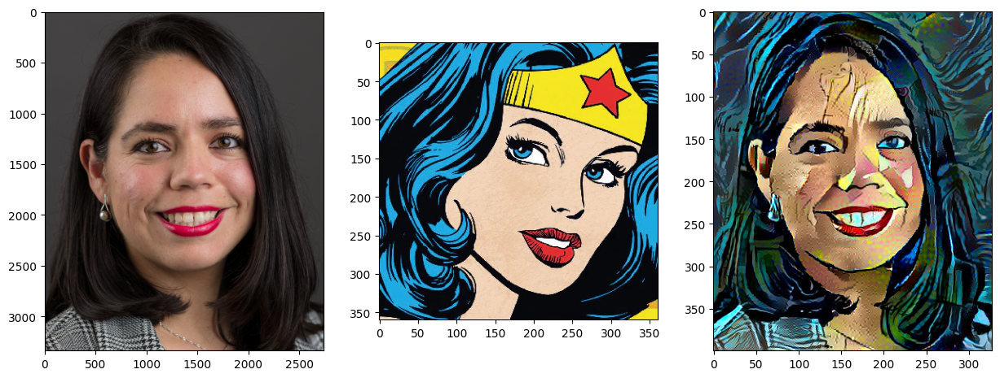

In [4]:
# --- ALE LLI ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/ALLI.jpeg")
style_path = Path("../02_Data/Style Photos/WonderWoman.png")

final_img_path= Path("Results/TeamMembers/ALLI_WonderWoman.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()


Iteration 100: loss=5182.52
Iteration 200: loss=4123.63
Iteration 300: loss=3654.68
Iteration 400: loss=3368.43
Iteration 500: loss=3165.45
Iteration 600: loss=3007.37
Iteration 700: loss=2881.70
Iteration 800: loss=2778.14
Iteration 900: loss=2692.34
Iteration 1000: loss=2618.80
Iteration 1100: loss=2556.08
Iteration 1200: loss=2502.07
Iteration 1300: loss=2454.44
Iteration 1400: loss=2412.08
Iteration 1500: loss=2373.72
Iteration 1600: loss=2338.79
Iteration 1700: loss=2307.09
Iteration 1800: loss=2278.36
Iteration 1900: loss=2251.79
Iteration 2000: loss=2226.92
Iteration 2100: loss=2203.71
Iteration 2200: loss=2182.25
Iteration 2300: loss=2162.36
Iteration 2400: loss=2143.91
Iteration 2500: loss=2126.82
Iteration 2600: loss=2110.87
Iteration 2700: loss=2095.85
Iteration 2800: loss=2081.76
Iteration 2900: loss=2068.51
Iteration 3000: loss=2056.04
Iteration 3100: loss=2044.23
Iteration 3200: loss=2033.10
Iteration 3300: loss=2022.54
Iteration 3400: loss=2012.58
Iteration 3500: loss=20

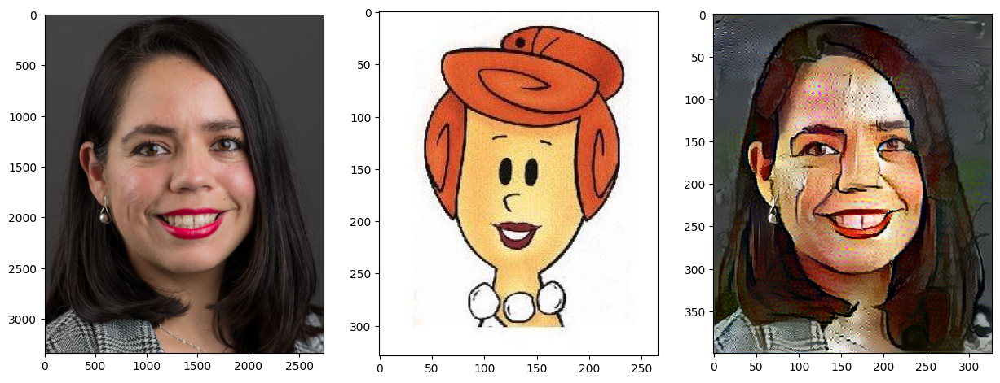

In [8]:
# --- ALE LLI ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/ALLI.jpeg")
style_path = Path("../02_Data/Style Photos/WilmaFlinstones.jpeg")

final_img_path= Path("Results/TeamMembers/ALLI_Filnstones.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=4993.73
Iteration 200: loss=3881.91
Iteration 300: loss=3423.95
Iteration 400: loss=3130.31
Iteration 500: loss=2966.85
Iteration 600: loss=2815.57
Iteration 700: loss=2714.74
Iteration 800: loss=2628.50
Iteration 900: loss=2551.49
Iteration 1000: loss=2481.79
Iteration 1100: loss=2429.23
Iteration 1200: loss=2376.56
Iteration 1300: loss=2331.98
Iteration 1400: loss=2291.83
Iteration 1500: loss=2254.92
Iteration 1600: loss=2222.31
Iteration 1700: loss=2192.94
Iteration 1800: loss=2166.41
Iteration 1900: loss=2141.86
Iteration 2000: loss=2119.70
Iteration 2100: loss=2099.38
Iteration 2200: loss=2080.68
Iteration 2300: loss=2063.33
Iteration 2400: loss=2047.37
Iteration 2500: loss=2032.57
Iteration 2600: loss=2018.74
Iteration 2700: loss=2005.90
Iteration 2800: loss=1993.87
Iteration 2900: loss=1982.55
Iteration 3000: loss=1971.90
Iteration 3100: loss=1961.88
Iteration 3200: loss=1952.45
Iteration 3300: loss=1943.49
Iteration 3400: loss=1935.00
Iteration 3500: loss=19

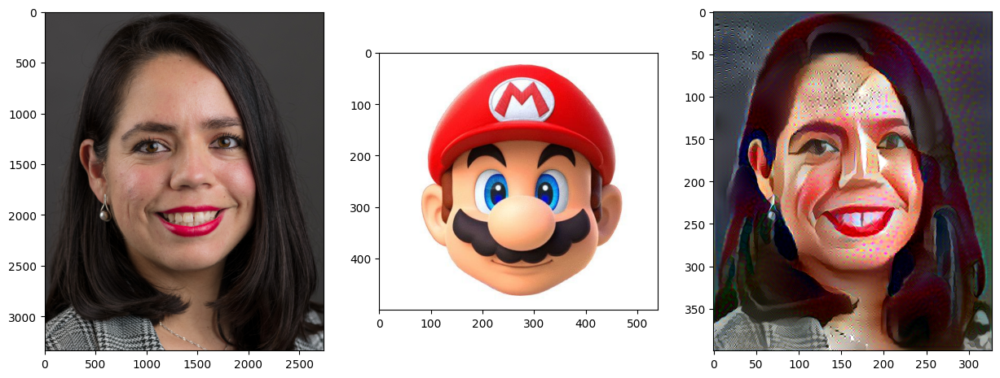

In [7]:
# --- ALE LLI ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/ALLI.jpeg")
style_path = Path("../02_Data/Style Photos/Mario.jpeg")

final_img_path= Path("Results/TeamMembers/ALLI_Mario.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=10566.40
Iteration 200: loss=7224.48
Iteration 300: loss=7489.99
Iteration 400: loss=4641.25
Iteration 500: loss=4005.96
Iteration 600: loss=3647.07
Iteration 700: loss=3372.72
Iteration 800: loss=3165.10
Iteration 900: loss=2986.83
Iteration 1000: loss=2830.12
Iteration 1100: loss=2683.31
Iteration 1200: loss=2637.41
Iteration 1300: loss=2481.96
Iteration 1400: loss=2391.58
Iteration 1500: loss=2317.11
Iteration 1600: loss=2258.33
Iteration 1700: loss=2190.40
Iteration 1800: loss=2133.82
Iteration 1900: loss=2082.14
Iteration 2000: loss=2033.87
Iteration 2100: loss=1990.98
Iteration 2200: loss=1951.68
Iteration 2300: loss=1915.62
Iteration 2400: loss=1882.41
Iteration 2500: loss=1851.75
Iteration 2600: loss=1823.44
Iteration 2700: loss=1797.16
Iteration 2800: loss=1772.77
Iteration 2900: loss=1750.10
Iteration 3000: loss=1728.79
Iteration 3100: loss=1708.77
Iteration 3200: loss=1689.93
Iteration 3300: loss=1672.22
Iteration 3400: loss=1655.52
Iteration 3500: loss=1

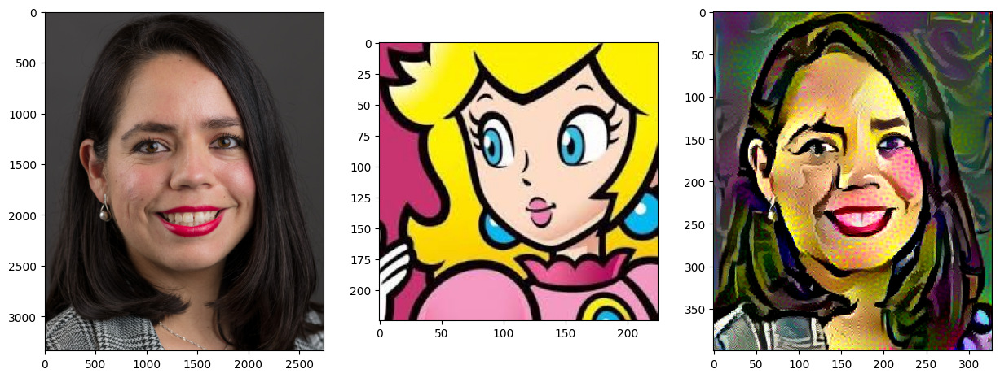

In [9]:
# --- ALE LLI ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/ALLI.jpeg")
style_path = Path("../02_Data/Style Photos/Peach.jpeg")

final_img_path= Path("Results/TeamMembers/ALLI_Peach.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=4301.36
Iteration 200: loss=3877.90
Iteration 300: loss=2723.39
Iteration 400: loss=2433.73
Iteration 500: loss=2235.04
Iteration 600: loss=2085.95
Iteration 700: loss=1970.08
Iteration 800: loss=1877.69
Iteration 900: loss=1801.11
Iteration 1000: loss=1737.08
Iteration 1100: loss=1682.05
Iteration 1200: loss=1634.14
Iteration 1300: loss=1591.87
Iteration 1400: loss=1554.58
Iteration 1500: loss=1521.64
Iteration 1600: loss=1492.32
Iteration 1700: loss=1465.95
Iteration 1800: loss=1442.02
Iteration 1900: loss=1420.16
Iteration 2000: loss=1400.13
Iteration 2100: loss=1381.74
Iteration 2200: loss=1364.77
Iteration 2300: loss=1349.32
Iteration 2400: loss=1335.08
Iteration 2500: loss=1321.86
Iteration 2600: loss=1309.62
Iteration 2700: loss=1298.23
Iteration 2800: loss=1287.62
Iteration 2900: loss=1277.71
Iteration 3000: loss=1268.42
Iteration 3100: loss=1259.71
Iteration 3200: loss=1251.52
Iteration 3300: loss=1243.75
Iteration 3400: loss=1236.42
Iteration 3500: loss=12

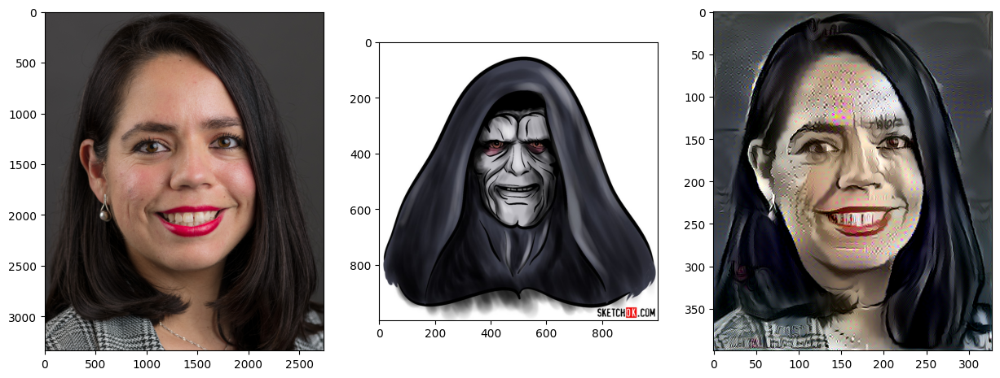

In [6]:
# --- ALE LLI ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/ALLI.jpeg")
style_path = Path("../02_Data/Style Photos/Palpatine.jpeg")

final_img_path= Path("Results/TeamMembers/ALLI_Palpatine.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=6449.79
Iteration 200: loss=4102.42
Iteration 300: loss=3424.85
Iteration 400: loss=2592.08
Iteration 500: loss=2394.19
Iteration 600: loss=2102.29
Iteration 700: loss=2239.05
Iteration 800: loss=1663.80
Iteration 900: loss=1757.77
Iteration 1000: loss=1517.16
Iteration 1100: loss=1413.75
Iteration 1200: loss=1311.99
Iteration 1300: loss=1262.25
Iteration 1400: loss=1209.82
Iteration 1500: loss=1166.57
Iteration 1600: loss=1133.87
Iteration 1700: loss=1101.12
Iteration 1800: loss=1072.85
Iteration 1900: loss=1047.63
Iteration 2000: loss=1024.13
Iteration 2100: loss=1003.03
Iteration 2200: loss=983.59
Iteration 2300: loss=965.83
Iteration 2400: loss=949.55
Iteration 2500: loss=934.60
Iteration 2600: loss=920.91
Iteration 2700: loss=908.29
Iteration 2800: loss=896.63
Iteration 2900: loss=885.91
Iteration 3000: loss=875.99
Iteration 3100: loss=866.78
Iteration 3200: loss=858.24
Iteration 3300: loss=850.25
Iteration 3400: loss=842.76
Iteration 3500: loss=835.74
Iteratio

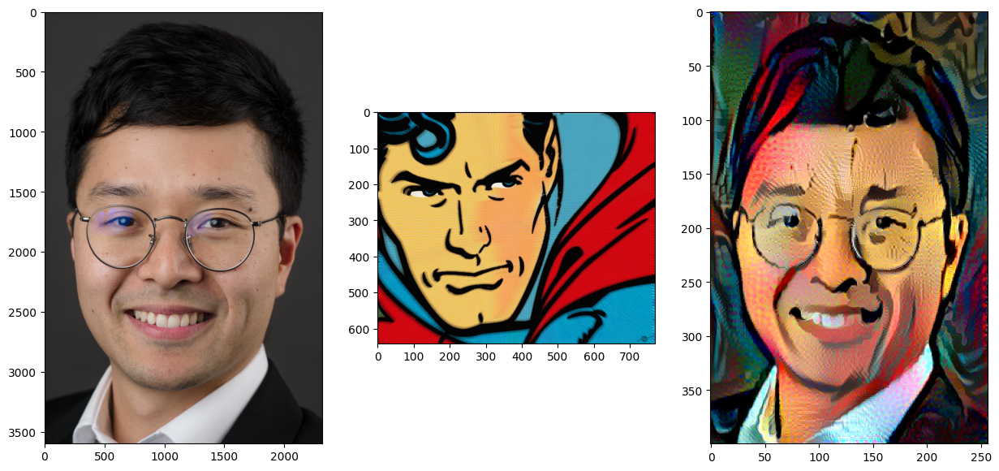

In [13]:
# --- Ruben ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/RN.jpg")
style_path = Path("../02_Data/Style Photos/Superman.jpeg")

final_img_path= Path("Results/TeamMembers/RN_Superman.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()


Iteration 100: loss=15558.65
Iteration 200: loss=6338.11
Iteration 300: loss=3650.46
Iteration 400: loss=3256.22
Iteration 500: loss=5748.85
Iteration 600: loss=2383.25
Iteration 700: loss=2270.18
Iteration 800: loss=2035.15
Iteration 900: loss=2032.59
Iteration 1000: loss=1765.35
Iteration 1100: loss=1742.30
Iteration 1200: loss=1596.32
Iteration 1300: loss=1575.10
Iteration 1400: loss=1479.92
Iteration 1500: loss=1421.85
Iteration 1600: loss=1385.08
Iteration 1700: loss=1344.06
Iteration 1800: loss=1305.97
Iteration 1900: loss=1270.78
Iteration 2000: loss=1250.35
Iteration 2100: loss=1217.26
Iteration 2200: loss=1193.72
Iteration 2300: loss=1173.02
Iteration 2400: loss=1153.92
Iteration 2500: loss=1136.21
Iteration 2600: loss=1120.11
Iteration 2700: loss=1105.38
Iteration 2800: loss=1091.82
Iteration 2900: loss=1079.15
Iteration 3000: loss=1067.45
Iteration 3100: loss=1056.60
Iteration 3200: loss=1046.46
Iteration 3300: loss=1036.96
Iteration 3400: loss=1028.09
Iteration 3500: loss=1

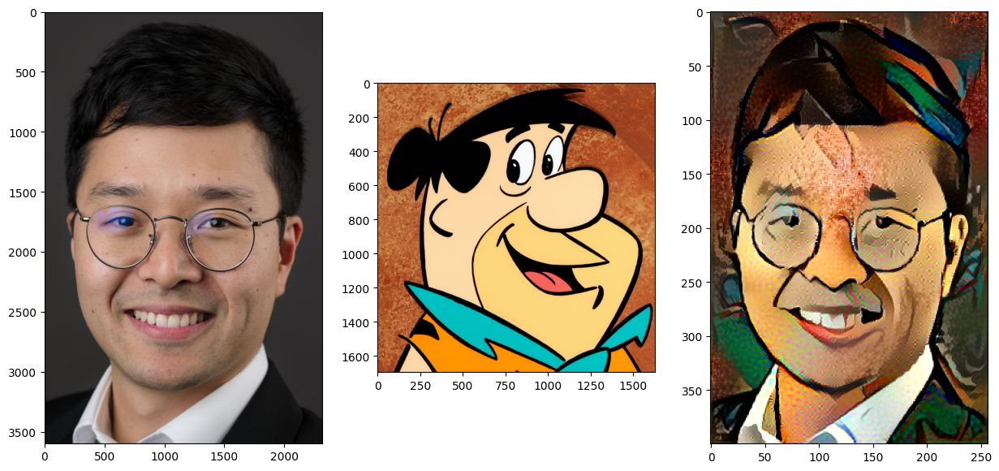

In [14]:
# --- Ruben ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/RN.jpg")
style_path = Path("../02_Data/Style Photos/FredFlinston.jpeg")

final_img_path= Path("Results/TeamMembers/RN_Flinstons.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()


Iteration 100: loss=5351.54
Iteration 200: loss=5000.38
Iteration 300: loss=3232.19
Iteration 400: loss=2826.20
Iteration 500: loss=2683.31
Iteration 600: loss=3199.39
Iteration 700: loss=2379.97
Iteration 800: loss=2279.84
Iteration 900: loss=2207.01
Iteration 1000: loss=2177.28
Iteration 1100: loss=2091.80
Iteration 1200: loss=2046.20
Iteration 1300: loss=2005.46
Iteration 1400: loss=1962.42
Iteration 1500: loss=1927.40
Iteration 1600: loss=1898.85
Iteration 1700: loss=1871.78
Iteration 1800: loss=1848.06
Iteration 1900: loss=1826.11
Iteration 2000: loss=1806.29
Iteration 2100: loss=1787.45
Iteration 2200: loss=1770.27
Iteration 2300: loss=1754.38
Iteration 2400: loss=1739.80
Iteration 2500: loss=1726.29
Iteration 2600: loss=1713.85
Iteration 2700: loss=1702.31
Iteration 2800: loss=1691.46
Iteration 2900: loss=1681.23
Iteration 3000: loss=1671.66
Iteration 3100: loss=1662.69
Iteration 3200: loss=1654.26
Iteration 3300: loss=1646.23
Iteration 3400: loss=1638.65
Iteration 3500: loss=16

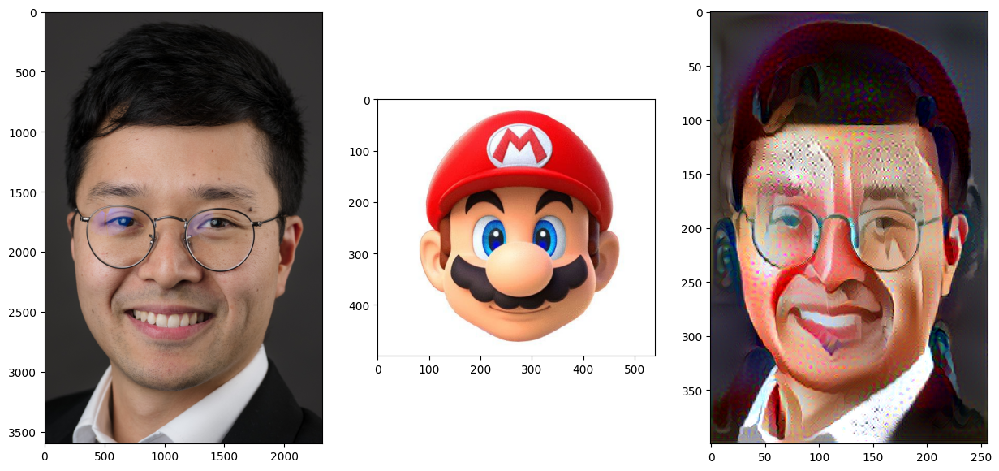

In [15]:
# --- Ruben ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/RN.jpg")
style_path = Path("../02_Data/Style Photos/Mario.jpeg")

final_img_path= Path("Results/TeamMembers/RN_Mario.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=4061.64
Iteration 200: loss=4014.29
Iteration 300: loss=2422.76
Iteration 400: loss=2184.41
Iteration 500: loss=3332.50
Iteration 600: loss=1741.02
Iteration 700: loss=1614.14
Iteration 800: loss=1541.30
Iteration 900: loss=1455.74
Iteration 1000: loss=1393.48
Iteration 1100: loss=1344.79
Iteration 1200: loss=1303.70
Iteration 1300: loss=1268.37
Iteration 1400: loss=1237.69
Iteration 1500: loss=1211.32
Iteration 1600: loss=1188.00
Iteration 1700: loss=1167.36
Iteration 1800: loss=1149.03
Iteration 1900: loss=1132.18
Iteration 2000: loss=1116.69
Iteration 2100: loss=1102.40
Iteration 2200: loss=1089.15
Iteration 2300: loss=1076.91
Iteration 2400: loss=1065.54
Iteration 2500: loss=1054.96
Iteration 2600: loss=1045.13
Iteration 2700: loss=1036.02
Iteration 2800: loss=1027.61
Iteration 2900: loss=1019.75
Iteration 3000: loss=1012.40
Iteration 3100: loss=1005.54
Iteration 3200: loss=999.14
Iteration 3300: loss=993.07
Iteration 3400: loss=987.39
Iteration 3500: loss=981.9

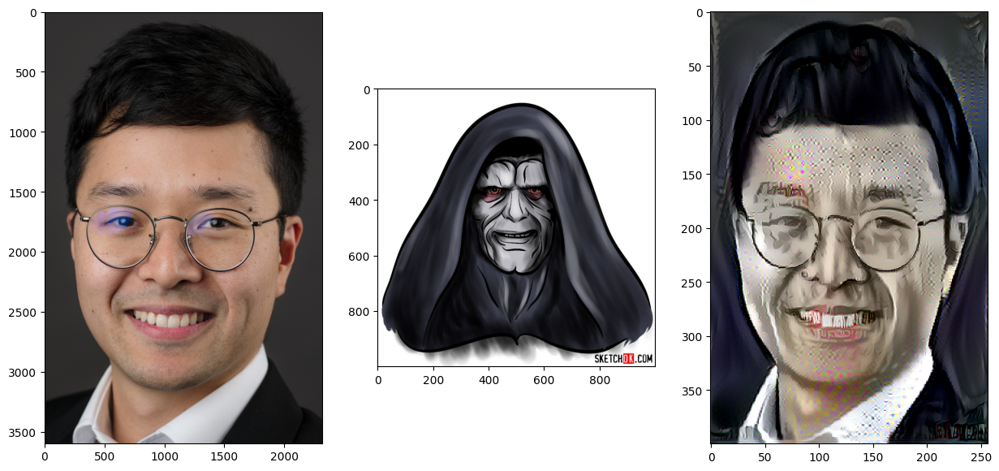

In [16]:
# --- Ruben ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/RN.jpg")
style_path = Path("../02_Data/Style Photos/Palpatine.jpeg")

final_img_path= Path("Results/TeamMembers/RN_Palpatine.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=6041.27
Iteration 200: loss=3733.51
Iteration 300: loss=2941.22
Iteration 400: loss=6082.45
Iteration 500: loss=2233.96
Iteration 600: loss=2075.31
Iteration 700: loss=1810.89
Iteration 800: loss=1660.15
Iteration 900: loss=1553.30
Iteration 1000: loss=1493.73
Iteration 1100: loss=1454.03
Iteration 1200: loss=1348.71
Iteration 1300: loss=1291.09
Iteration 1400: loss=1248.02
Iteration 1500: loss=1207.46
Iteration 1600: loss=1172.25
Iteration 1700: loss=1140.28
Iteration 1800: loss=1112.02
Iteration 1900: loss=1086.43
Iteration 2000: loss=1063.42
Iteration 2100: loss=1042.46
Iteration 2200: loss=1023.36
Iteration 2300: loss=1005.88
Iteration 2400: loss=989.82
Iteration 2500: loss=975.08
Iteration 2600: loss=961.48
Iteration 2700: loss=948.82
Iteration 2800: loss=937.02
Iteration 2900: loss=926.02
Iteration 3000: loss=915.79
Iteration 3100: loss=906.21
Iteration 3200: loss=897.25
Iteration 3300: loss=888.84
Iteration 3400: loss=880.98
Iteration 3500: loss=873.59
Iterat

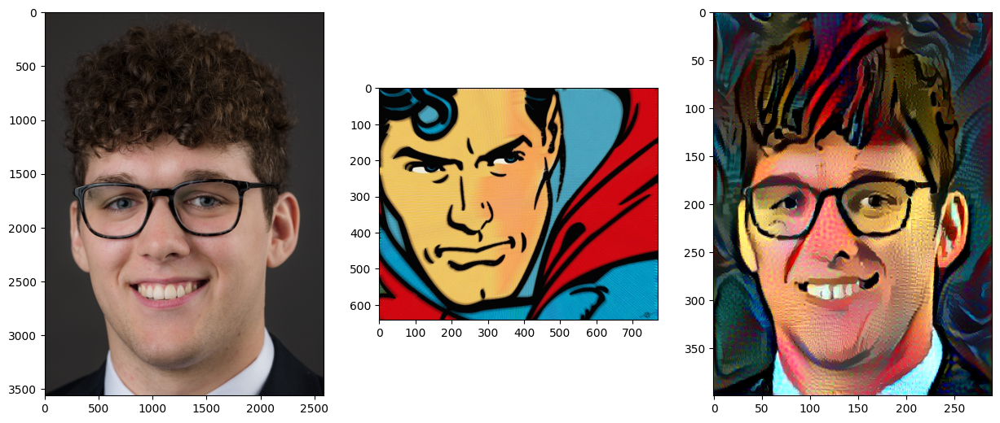

In [17]:
# --- SAM ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/SS.jpg")
style_path = Path("../02_Data/Style Photos/Superman.jpeg")

final_img_path= Path("Results/TeamMembers/SS_Superman.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=6938.44
Iteration 200: loss=4919.77
Iteration 300: loss=3651.95
Iteration 400: loss=2996.25
Iteration 500: loss=2660.75
Iteration 600: loss=2340.94
Iteration 700: loss=2837.72
Iteration 800: loss=1965.95
Iteration 900: loss=1855.15
Iteration 1000: loss=2379.49
Iteration 1100: loss=1672.46
Iteration 1200: loss=1598.56
Iteration 1300: loss=1533.90
Iteration 1400: loss=1479.33
Iteration 1500: loss=1429.44
Iteration 1600: loss=1386.88
Iteration 1700: loss=1348.65
Iteration 1800: loss=1314.62
Iteration 1900: loss=1284.59
Iteration 2000: loss=1257.86
Iteration 2100: loss=1233.77
Iteration 2200: loss=1211.81
Iteration 2300: loss=1191.85
Iteration 2400: loss=1173.47
Iteration 2500: loss=1156.67
Iteration 2600: loss=1141.18
Iteration 2700: loss=1126.83
Iteration 2800: loss=1113.59
Iteration 2900: loss=1101.28
Iteration 3000: loss=1089.74
Iteration 3100: loss=1078.99
Iteration 3200: loss=1068.97
Iteration 3300: loss=1059.60
Iteration 3400: loss=1050.80
Iteration 3500: loss=10

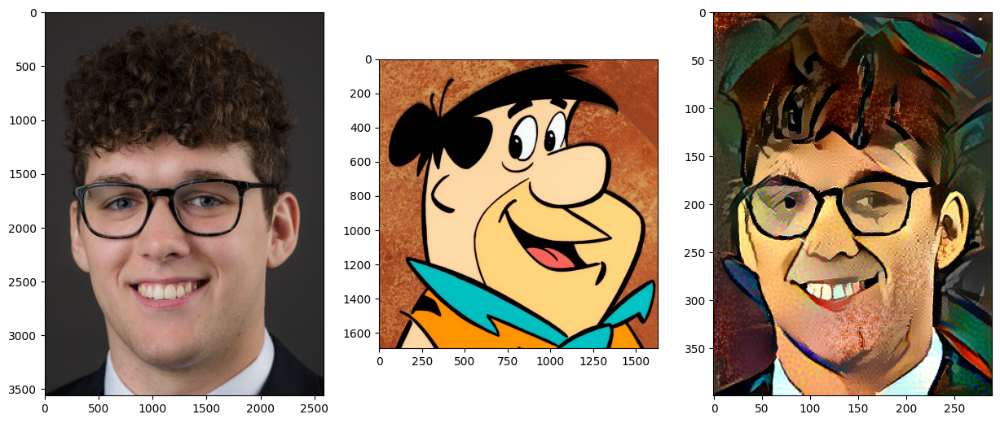

In [18]:
# --- SAM ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/SS.jpg")
style_path = Path("../02_Data/Style Photos/FredFlinston.jpeg")

final_img_path= Path("Results/TeamMembers/SS_Flinstons.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()


Iteration 100: loss=6897.29
Iteration 200: loss=3776.12
Iteration 300: loss=3532.08
Iteration 400: loss=3000.26
Iteration 500: loss=2573.95
Iteration 600: loss=2397.69
Iteration 700: loss=2287.48
Iteration 800: loss=2190.50
Iteration 900: loss=2140.54
Iteration 1000: loss=2065.74
Iteration 1100: loss=2017.70
Iteration 1200: loss=1973.26
Iteration 1300: loss=1931.28
Iteration 1400: loss=1896.18
Iteration 1500: loss=1863.63
Iteration 1600: loss=1834.36
Iteration 1700: loss=1808.46
Iteration 1800: loss=1784.97
Iteration 1900: loss=1763.70
Iteration 2000: loss=1744.10
Iteration 2100: loss=1726.06
Iteration 2200: loss=1709.53
Iteration 2300: loss=1694.16
Iteration 2400: loss=1680.03
Iteration 2500: loss=1666.93
Iteration 2600: loss=1654.74
Iteration 2700: loss=1643.36
Iteration 2800: loss=1632.69
Iteration 2900: loss=1622.69
Iteration 3000: loss=1613.30
Iteration 3100: loss=1604.56
Iteration 3200: loss=1596.34
Iteration 3300: loss=1588.69
Iteration 3400: loss=1581.43
Iteration 3500: loss=15

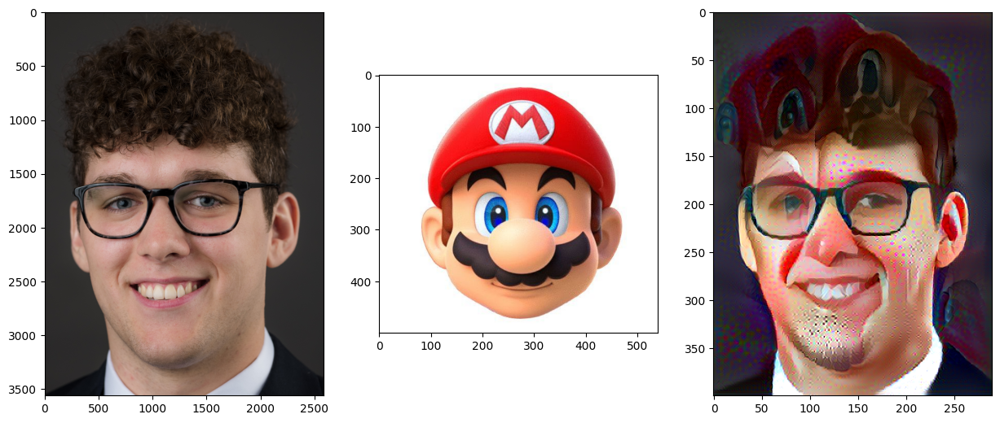

In [19]:
# --- SAM ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/SS.jpg")
style_path = Path("../02_Data/Style Photos/Mario.jpeg")

final_img_path= Path("Results/TeamMembers/SS_Mario.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=3967.36
Iteration 200: loss=2743.00
Iteration 300: loss=2259.56
Iteration 400: loss=1978.90
Iteration 500: loss=1792.38
Iteration 600: loss=1661.79
Iteration 700: loss=1564.08
Iteration 800: loss=1486.12
Iteration 900: loss=1423.60
Iteration 1000: loss=1370.59
Iteration 1100: loss=1325.07
Iteration 1200: loss=1284.61
Iteration 1300: loss=1249.29
Iteration 1400: loss=1218.11
Iteration 1500: loss=1190.25
Iteration 1600: loss=1165.87
Iteration 1700: loss=1144.23
Iteration 1800: loss=1124.82
Iteration 1900: loss=1107.24
Iteration 2000: loss=1091.26
Iteration 2100: loss=1076.50
Iteration 2200: loss=1062.97
Iteration 2300: loss=1050.51
Iteration 2400: loss=1038.99
Iteration 2500: loss=1028.25
Iteration 2600: loss=1018.14
Iteration 2700: loss=1008.76
Iteration 2800: loss=999.99
Iteration 2900: loss=991.76
Iteration 3000: loss=984.07
Iteration 3100: loss=976.91
Iteration 3200: loss=970.21
Iteration 3300: loss=963.89
Iteration 3400: loss=957.86
Iteration 3500: loss=952.35
It

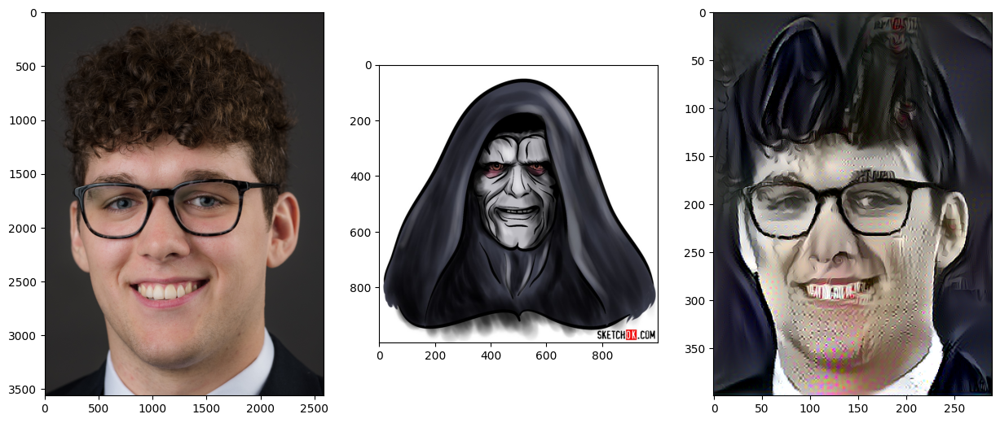

In [20]:
# --- SAM ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/SS.jpg")
style_path = Path("../02_Data/Style Photos/Palpatine.jpeg")

final_img_path= Path("Results/TeamMembers/SS_Palpatine.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=5625.27
Iteration 200: loss=3638.26
Iteration 300: loss=2777.81
Iteration 400: loss=2267.61
Iteration 500: loss=2052.76
Iteration 600: loss=1807.54
Iteration 700: loss=1657.61
Iteration 800: loss=1556.01
Iteration 900: loss=1428.42
Iteration 1000: loss=1362.95
Iteration 1100: loss=1301.10
Iteration 1200: loss=1244.02
Iteration 1300: loss=1198.79
Iteration 1400: loss=1158.13
Iteration 1500: loss=1122.23
Iteration 1600: loss=1090.97
Iteration 1700: loss=1062.94
Iteration 1800: loss=1037.68
Iteration 1900: loss=1014.68
Iteration 2000: loss=993.86
Iteration 2100: loss=974.94
Iteration 2200: loss=957.68
Iteration 2300: loss=941.90
Iteration 2400: loss=927.37
Iteration 2500: loss=913.95
Iteration 2600: loss=901.58
Iteration 2700: loss=890.13
Iteration 2800: loss=879.49
Iteration 2900: loss=869.55
Iteration 3000: loss=860.27
Iteration 3100: loss=851.62
Iteration 3200: loss=843.54
Iteration 3300: loss=835.99
Iteration 3400: loss=828.91
Iteration 3500: loss=822.25
Iteration 

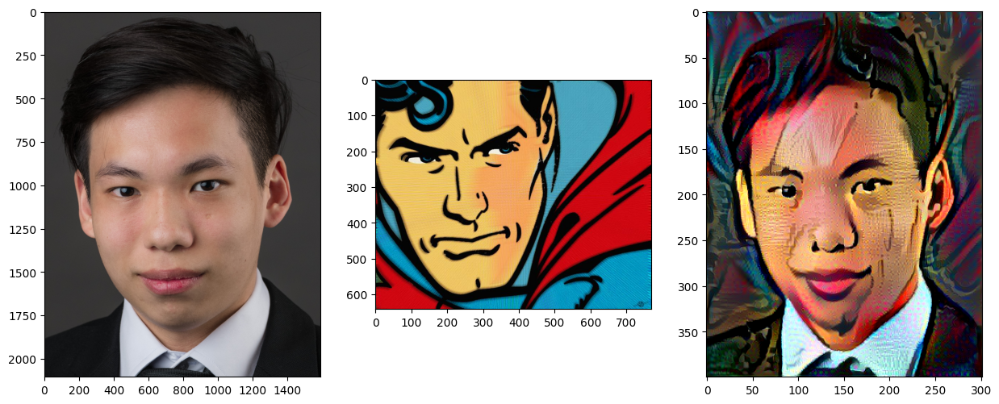

In [21]:
# --- BOSS ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/BP.jpg")
style_path = Path("../02_Data/Style Photos/Superman.jpeg")

final_img_path= Path("Results/TeamMembers/BP_Superman.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=10168.84
Iteration 200: loss=4454.92
Iteration 300: loss=4517.80
Iteration 400: loss=3533.58
Iteration 500: loss=2622.74
Iteration 600: loss=2331.06
Iteration 700: loss=2202.68
Iteration 800: loss=2035.73
Iteration 900: loss=1890.22
Iteration 1000: loss=1802.34
Iteration 1100: loss=1750.58
Iteration 1200: loss=1650.93
Iteration 1300: loss=1596.58
Iteration 1400: loss=1543.57
Iteration 1500: loss=1495.65
Iteration 1600: loss=1454.82
Iteration 1700: loss=1419.05
Iteration 1800: loss=1386.60
Iteration 1900: loss=1357.04
Iteration 2000: loss=1330.35
Iteration 2100: loss=1305.83
Iteration 2200: loss=1283.59
Iteration 2300: loss=1263.18
Iteration 2400: loss=1244.28
Iteration 2500: loss=1226.91
Iteration 2600: loss=1210.94
Iteration 2700: loss=1196.04
Iteration 2800: loss=1182.19
Iteration 2900: loss=1169.31
Iteration 3000: loss=1157.31
Iteration 3100: loss=1146.09
Iteration 3200: loss=1135.53
Iteration 3300: loss=1125.56
Iteration 3400: loss=1116.10
Iteration 3500: loss=1

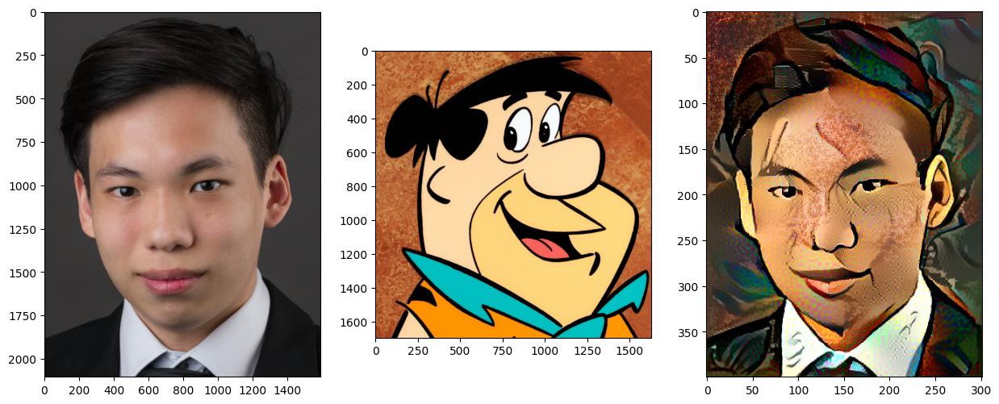

In [22]:
# --- BOSS ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/BP.jpg")
style_path = Path("../02_Data/Style Photos/FredFlinston.jpeg")

final_img_path= Path("Results/TeamMembers/BP_Flinstons.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=5637.50
Iteration 200: loss=3100.59
Iteration 300: loss=2607.34
Iteration 400: loss=2383.33
Iteration 500: loss=2213.51
Iteration 600: loss=2130.96
Iteration 700: loss=2023.04
Iteration 800: loss=1949.92
Iteration 900: loss=1884.07
Iteration 1000: loss=1834.77
Iteration 1100: loss=1790.62
Iteration 1200: loss=1749.88
Iteration 1300: loss=1716.11
Iteration 1400: loss=1686.44
Iteration 1500: loss=1658.98
Iteration 1600: loss=1634.37
Iteration 1700: loss=1612.18
Iteration 1800: loss=1592.15
Iteration 1900: loss=1573.98
Iteration 2000: loss=1557.21
Iteration 2100: loss=1541.68
Iteration 2200: loss=1527.38
Iteration 2300: loss=1514.00
Iteration 2400: loss=1501.67
Iteration 2500: loss=1490.29
Iteration 2600: loss=1479.76
Iteration 2700: loss=1469.94
Iteration 2800: loss=1460.73
Iteration 2900: loss=1452.16
Iteration 3000: loss=1444.07
Iteration 3100: loss=1436.46
Iteration 3200: loss=1429.32
Iteration 3300: loss=1422.60
Iteration 3400: loss=1416.25
Iteration 3500: loss=14

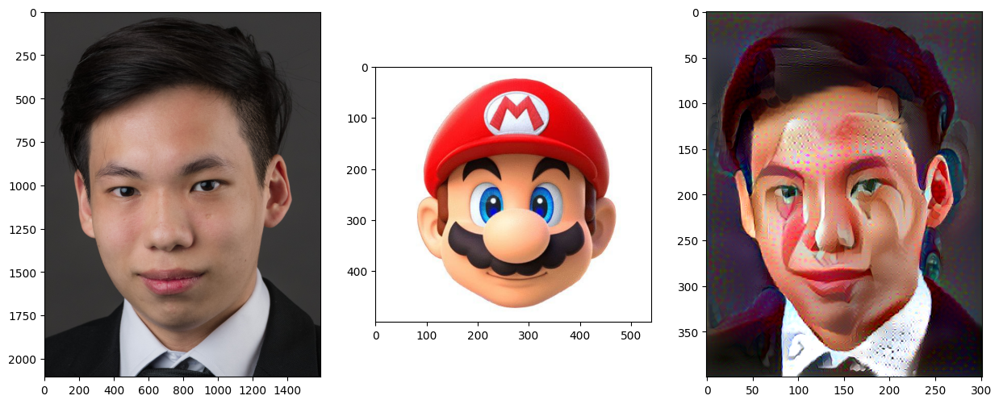

In [23]:
# --- BOSS ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/BP.jpg")
style_path = Path("../02_Data/Style Photos/Mario.jpeg")

final_img_path= Path("Results/TeamMembers/BP_Mario.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()

Iteration 100: loss=3498.20
Iteration 200: loss=2453.12
Iteration 300: loss=2047.05
Iteration 400: loss=1823.61
Iteration 500: loss=1678.41
Iteration 600: loss=1572.66
Iteration 700: loss=1489.80
Iteration 800: loss=1422.31
Iteration 900: loss=1365.76
Iteration 1000: loss=1317.59
Iteration 1100: loss=1276.33
Iteration 1200: loss=1241.08
Iteration 1300: loss=1210.20
Iteration 1400: loss=1182.32
Iteration 1500: loss=1157.68
Iteration 1600: loss=1136.02
Iteration 1700: loss=1116.62
Iteration 1800: loss=1098.87
Iteration 1900: loss=1082.77
Iteration 2000: loss=1068.18
Iteration 2100: loss=1054.93
Iteration 2200: loss=1042.71
Iteration 2300: loss=1031.42
Iteration 2400: loss=1020.92
Iteration 2500: loss=1011.07
Iteration 2600: loss=1001.78
Iteration 2700: loss=992.94
Iteration 2800: loss=984.67
Iteration 2900: loss=976.64
Iteration 3000: loss=969.11
Iteration 3100: loss=962.20
Iteration 3200: loss=955.80
Iteration 3300: loss=949.88
Iteration 3400: loss=944.31
Iteration 3500: loss=939.07
Ite

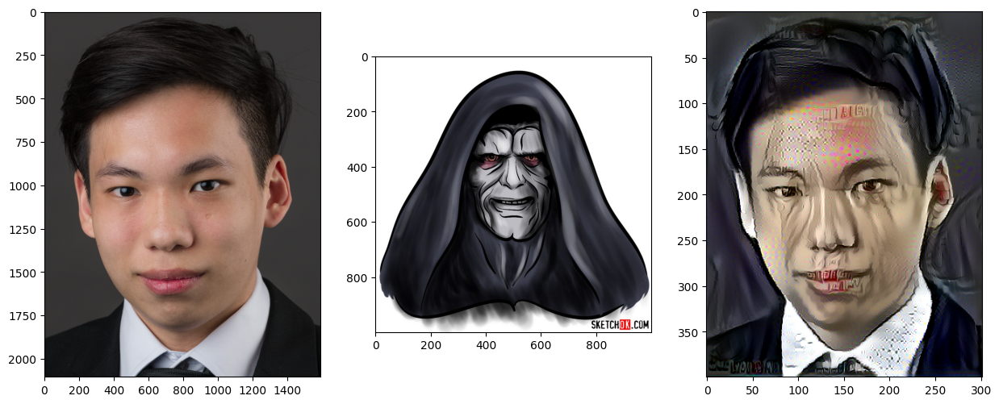

In [24]:
# --- BOSS ----
# Select base and style image
base_path = Path("../02_Data/Test Photos/BP.jpg")
style_path = Path("../02_Data/Style Photos/Palpatine.jpeg")

final_img_path= Path("Results/TeamMembers/BP_Palpatine.png")
style_weight = 1e-6
content_weight = 2.5e-8

# Run transfer learning
new_img = st.train_StyleTransfer(style_path = style_path, base_path = base_path, n_iter = n_iter,
                                 style_layers = style_layers, content_layers = content_layers,
                                 style_weight = style_weight, content_weight = content_weight,
                                 final_img_path = final_img_path, feature_extractor = feature_extractor,
                                 mod_name = mod_name, learning_rate = learning_rate,
                                 decay_steps = decay_steps, decay_rate = decay_rate)

# --- Visualize the images ---
base_img = plt.imread(base_path)
style_img = plt.imread(style_path)

fig, ax = plt.subplots(1, 3, figsize = (15,15))
ax[0].imshow(base_img)
ax[1].imshow(style_img)
ax[2].imshow(new_img)
plt.show()